Importing the Python Libraries


In [30]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import date,datetime

Loading the Loan data into the DataFrame

In [31]:
loan = pd.read_csv(r'C:\Users\nithinr\Downloads\Learning - DS\loan\loan.csv',low_memory=False)
loan.head(2)

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,...,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,...,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN


Drop the columns which do not have data for all the rows

In [32]:
nullcount = loan.isnull().sum()
nullcount = nullcount[nullcount.values==len(loan)]
loan = loan.drop(nullcount.index,axis=1)


In [33]:
loan.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39717 entries, 0 to 39716
Data columns (total 57 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   id                          39717 non-null  int64  
 1   member_id                   39717 non-null  int64  
 2   loan_amnt                   39717 non-null  int64  
 3   funded_amnt                 39717 non-null  int64  
 4   funded_amnt_inv             39717 non-null  float64
 5   term                        39717 non-null  object 
 6   int_rate                    39717 non-null  object 
 7   installment                 39717 non-null  float64
 8   grade                       39717 non-null  object 
 9   sub_grade                   39717 non-null  object 
 10  emp_title                   37258 non-null  object 
 11  emp_length                  38642 non-null  object 
 12  home_ownership              39717 non-null  object 
 13  annual_inc                  397

In [34]:
# remove columns with 30% or more null values
nullcount = loan.isnull().sum()
nullcount = nullcount[nullcount.values>(0.3*len(loan))]
loan = loan.drop(nullcount.index,axis=1)





In [35]:
# remove rows with 30% or more null values
nullcount = loan.isnull().sum(axis=1)
nullcount = nullcount[nullcount.values>(0.3*len(loan.columns))]
loan = loan.drop(nullcount.index,axis=0)


In [36]:
loan.describe(include = 'object').transpose()

,count,unique,top,freq
term,39717,2,36 months,29096
int_rate,39717,371,10.99%,956
grade,39717,7,B,12020
sub_grade,39717,35,B3,2917
emp_title,37258,28820,US Army,134
emp_length,38642,11,10+ years,8879
home_ownership,39717,5,RENT,18899
verification_status,39717,3,Not Verified,16921
issue_d,39717,55,Dec-11,2260
loan_status,39717,3,Fully Paid,32950


In [37]:
# remove columns with 1 unique value
uniquecount = loan.nunique()
uniquecount = uniquecount[uniquecount.values==1]
loan = loan.drop(uniquecount.index,axis=1)

Conversions Required in Dataset

In [38]:
 loan['int_rate']=loan['int_rate'].apply(lambda x: x.replace('%','') if '%' in str(x) else x )
 loan['int_rate'] = loan['int_rate'].astype('float64')
 loan['issue_d']= pd.to_datetime(loan['issue_d'],format='%b-%y')
 loan['last_pymnt_d']= pd.to_datetime(loan['last_pymnt_d'],format='%b-%y')
 loan['last_credit_pull_d']= pd.to_datetime(loan['last_credit_pull_d'],format='%b-%y')
 loan['earliest_cr_line']= pd.to_datetime(loan['earliest_cr_line'],format='%b-%y')
 loan['fully_paid']=loan['loan_status'].apply(lambda x: 1 if 'Fully Paid' in x else 0 )
 loan['charged_off']=loan['loan_status'].apply(lambda x: 1 if 'Charged Off' in x else 0 )
 loan['LoanIncomeRatio'] = loan['loan_amnt']/loan['annual_inc']
 loan['IssueYear'] = loan['issue_d'].apply(lambda x: x.year)

In [39]:
# remove Category  columns with more than 100 unique values
uniquecount = loan.select_dtypes(include='object').nunique()
uniquecount = uniquecount[uniquecount.values>100]
loan = loan.drop(uniquecount.index,axis=1)




Seggregate the data into numeric and categorical columns

In [40]:
numerical = ['loan_amnt','funded_amnt','funded_amnt_inv','int_rate','installment','annual_inc','dti','open_acc','pub_rec','total_acc','pub_rec_bankruptcies','LoanIncomeRatio']

category = ['term','grade','emp_length','home_ownership','verification_status','loan_status','purpose','addr_state']

Checking Value Distributions

In [41]:
loan.describe(percentiles = [0.01, 0.05, 0.10, 0.25, 0.50, 0.75, 0.90, 0.95, 0.99]).transpose()

,count,mean,min,1%,5%,10%,25%,50%,75%,90%,95%,99%,max,std
id,39717.0,683131.91306,54734.0,221269.92,372418.4,427720.2,516221.0,665665.0,837755.0,1007009.4,1039966.2,1063236.4,1077501.0,210694.132915
member_id,39717.0,850463.559408,70699.0,220676.32,388192.4,501897.8,666780.0,850812.0,1047339.0,1232878.2,1269461.8,1295366.44,1314167.0,265678.307421
loan_amnt,39717.0,11219.443815,500.0,1200.0,2400.0,3200.0,5500.0,10000.0,15000.0,22000.0,25000.0,35000.0,35000.0,7456.670694
funded_amnt,39717.0,10947.713196,500.0,1200.0,2400.0,3200.0,5400.0,9600.0,15000.0,21000.0,25000.0,35000.0,35000.0,7187.23867
funded_amnt_inv,39717.0,10397.448868,0.0,675.000643,1873.658,2950.0,5000.0,8975.0,14400.0,20000.0,24736.572264,34750.0,35000.0,7128.450439
int_rate,39717.0,12.021177,5.42,5.42,6.17,7.14,9.25,11.86,14.59,16.89,18.54,20.99,24.59,3.724825
installment,39717.0,324.561922,15.69,37.61,71.246,99.45,167.02,280.22,430.78,622.952,762.996,931.5416,1305.19,208.874874
annual_inc,39717.0,68968.926377,4000.0,14400.0,24000.0,30000.0,40404.0,59000.0,82300.0,116000.0,142000.0,234999.36,6000000.0,63793.76579
issue_d,39717,2010-11-03 23:26:45.166553344,2007-06-01 00:00:00,2008-01-01 00:00:00,2009-01-01 00:00:00,2009-08-01 00:00:00,2010-05-01 00:00:00,2011-02-01 00:00:00,2011-08-01 00:00:00,2011-11-01 00:00:00,2011-12-01 00:00:00,2011-12-01 00:00:00,2011-12-01 00:00:00,NaN
dti,39717.0,13.31513,0.0,0.35,2.13,4.08,8.17,13.4,18.6,22.33,23.84,26.68,29.99,6.678594


Univariate analysis to find the outliers in data

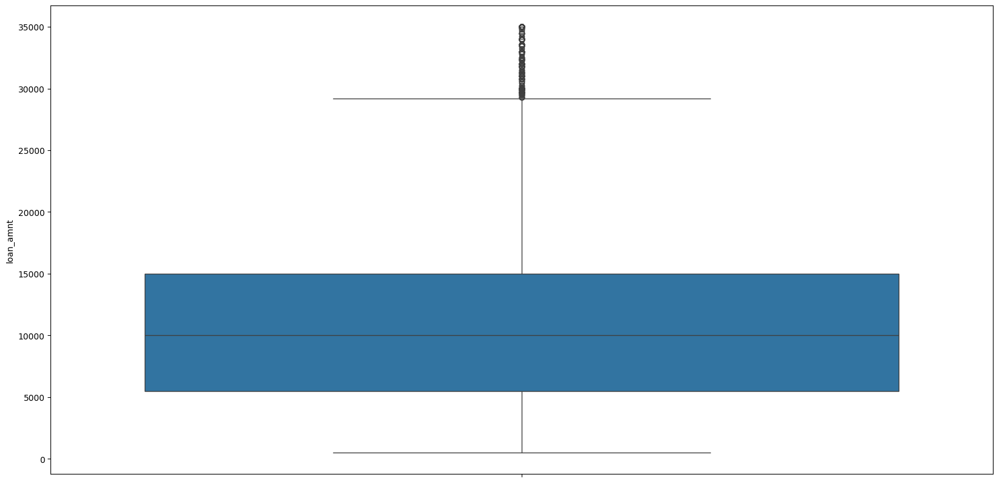

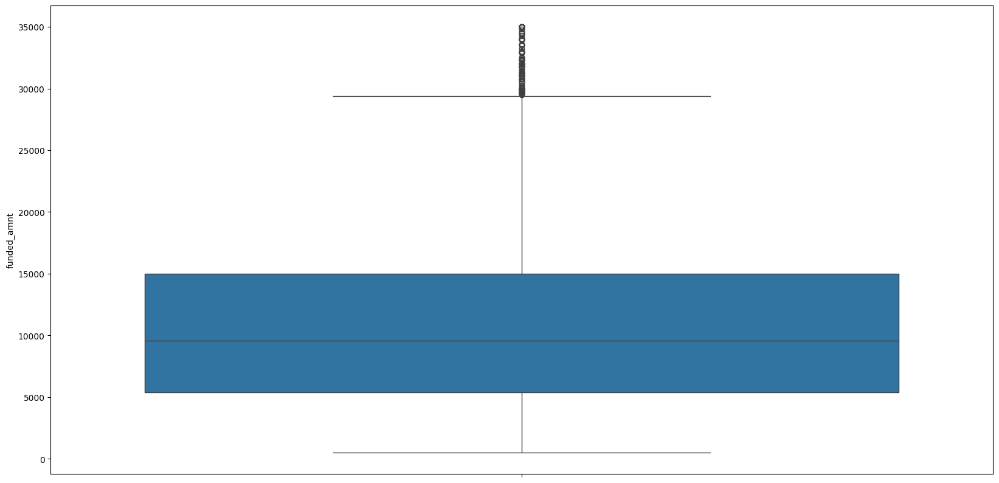

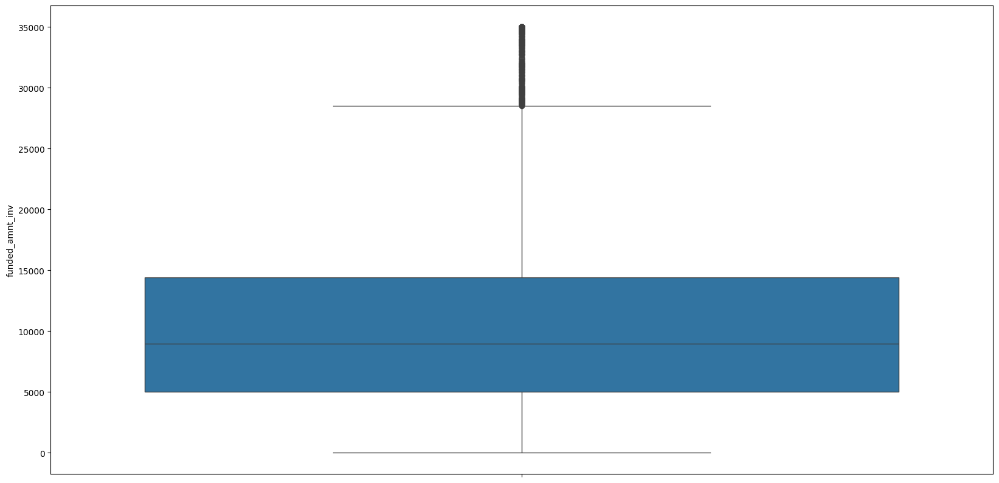

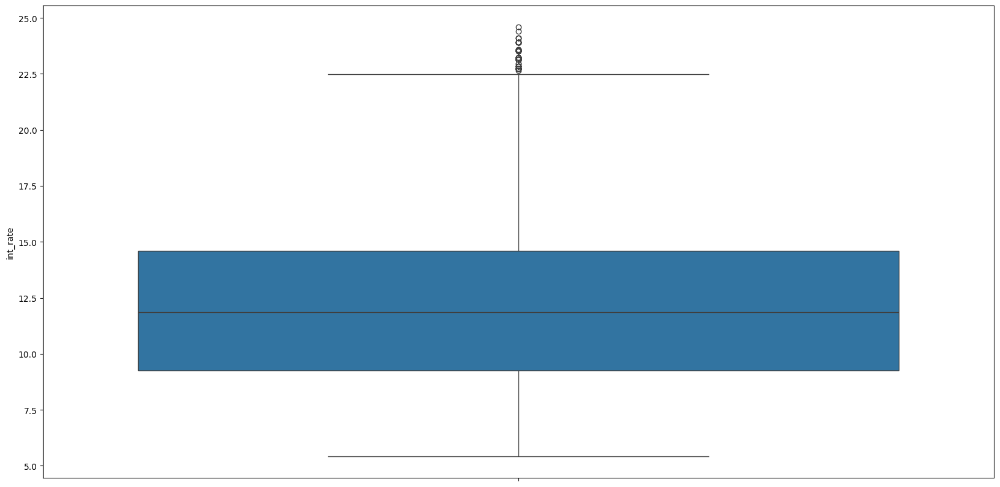

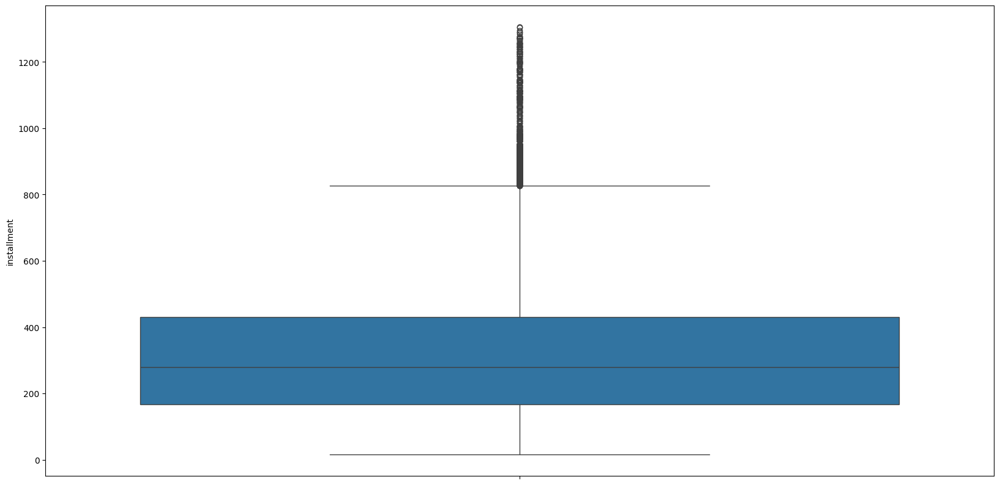

...

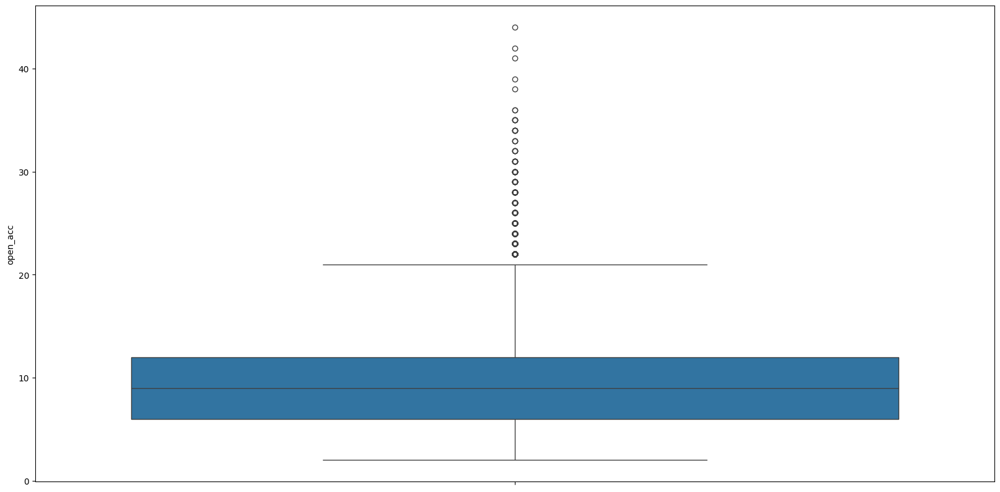

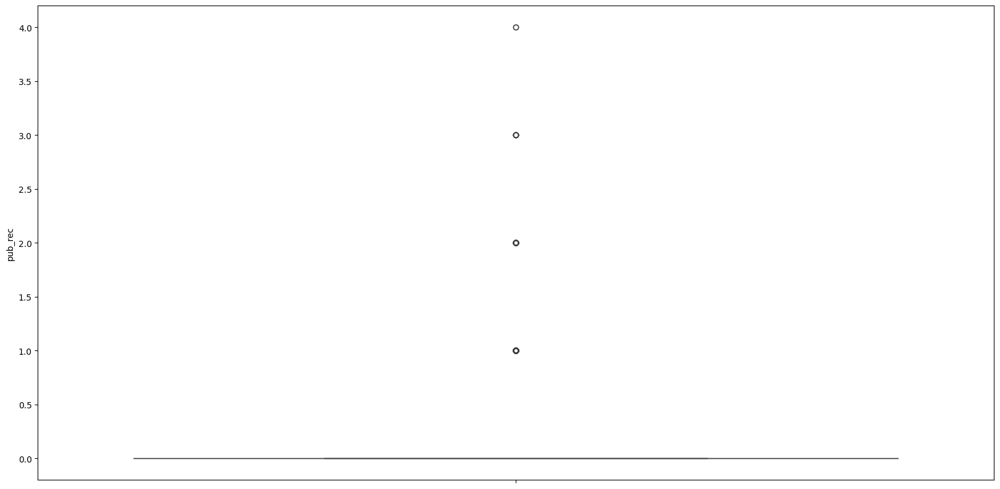

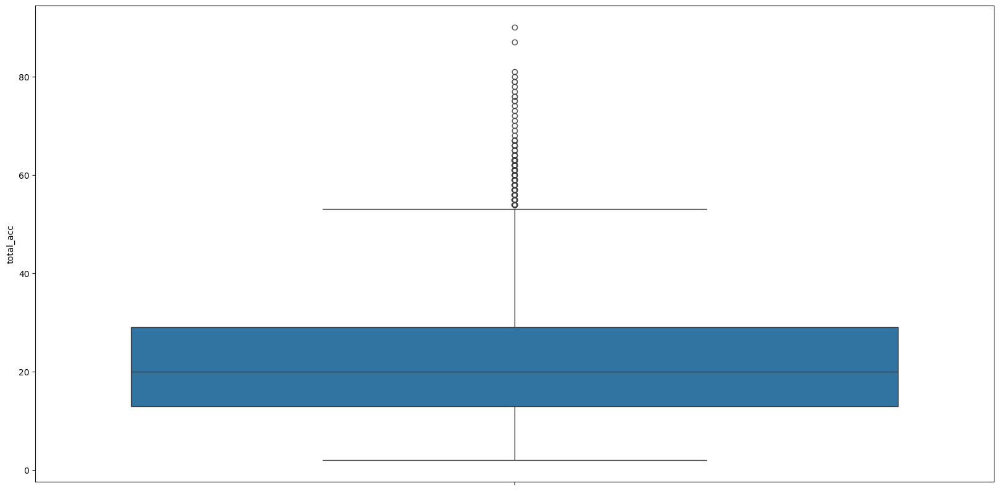

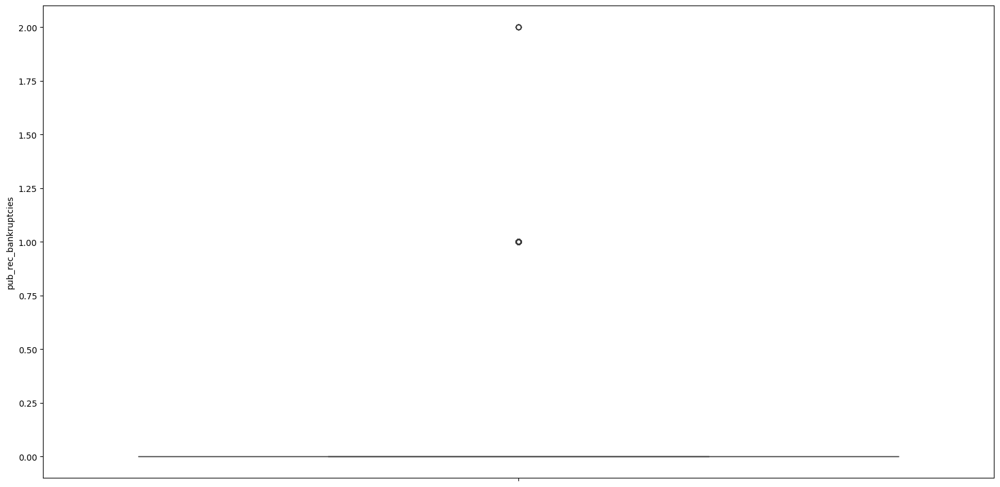

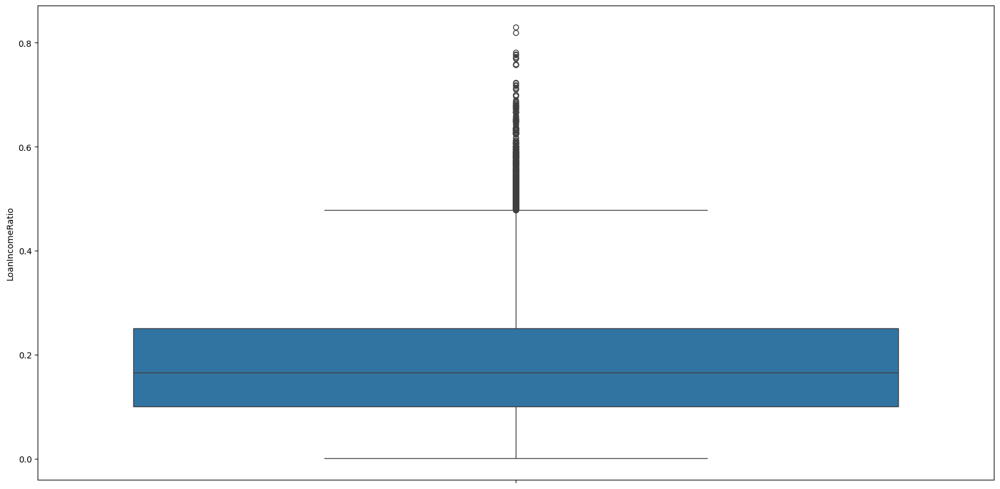

In [42]:

for col in numerical:
    plt.figure(figsize = (20, 10))
    sns.boxplot(data=loan[col])
    plt.show()

Observations: There are outliers 'annual_inc'  need to remove those outliers taking 1% to 99% values

Removing Outliers for annual income

In [43]:
q1 = loan['annual_inc'].quantile(0.01)
q4 = loan['annual_inc'].quantile(0.99)
loan = loan[(loan['annual_inc']>=q1) & (loan['annual_inc']<=q4)]




Plot how loans distributed with issue date

<Axes: xlabel='IssueYear'>

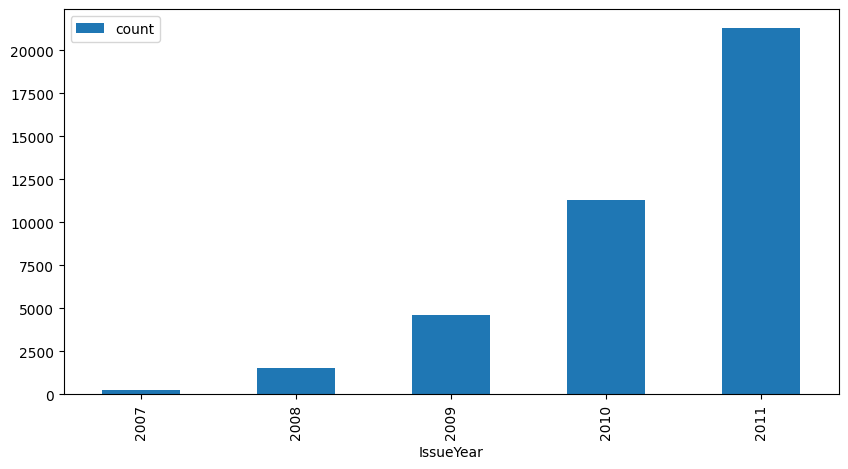

In [44]:

loan['IssueYear'].value_counts().reset_index().sort_values(by='count').plot(x='IssueYear',y='count',kind='bar',figsize=(10,5))

Bivariate Analysis on numerical columns to find the correlation between the variables

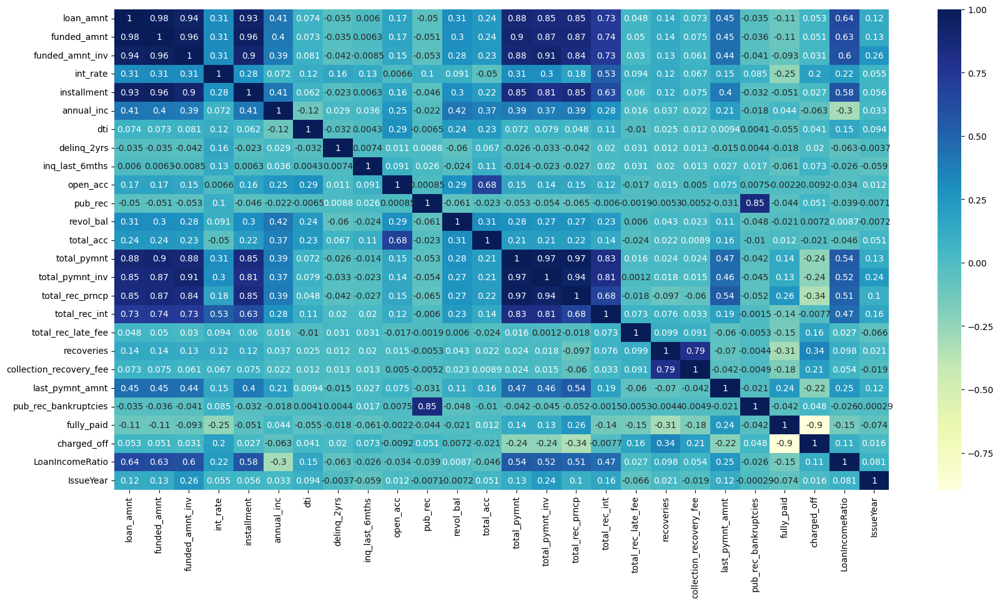

In [45]:

numeric_df = loan.select_dtypes(include=['int64', 'float64'])
numeric_df=numeric_df.drop(['id','member_id','out_prncp_inv','out_prncp'],axis=1)
plt.figure(figsize=(20,10))
sns.heatmap(numeric_df.corr(), annot=True, cmap="YlGnBu")
plt.show()

Observations : The above heat map we see there is high coorelation between installment , loan/funded amount and total payment and principal received
2) when recoveries and collection recovery fee increases it is more likely to be charged off


Analysis on Categorical values

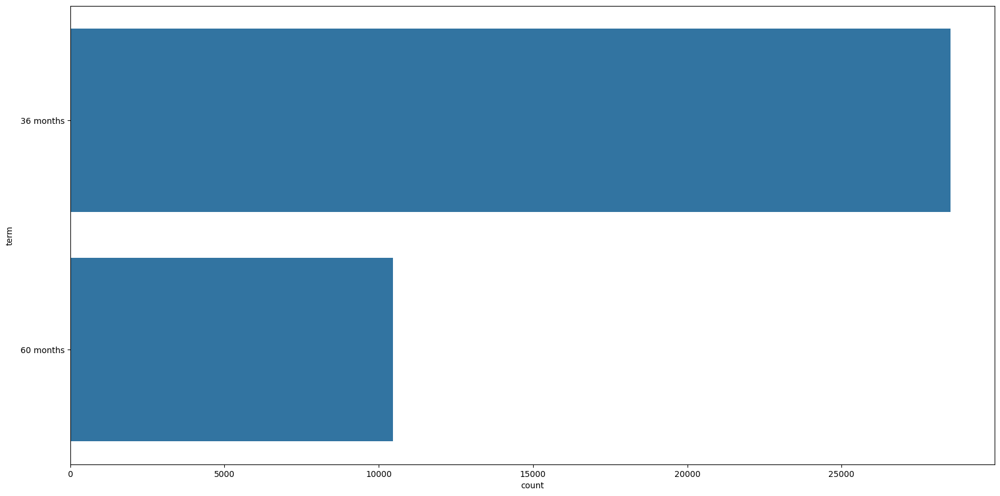

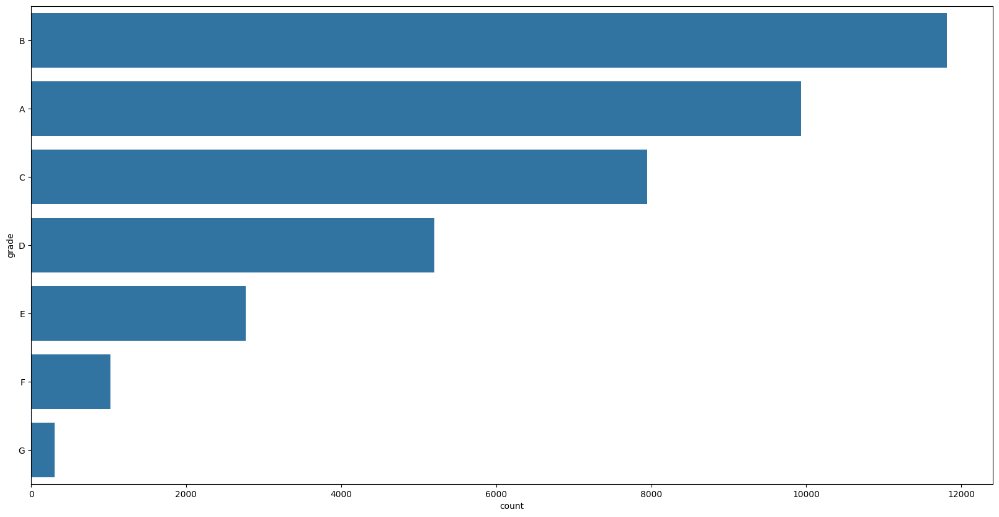

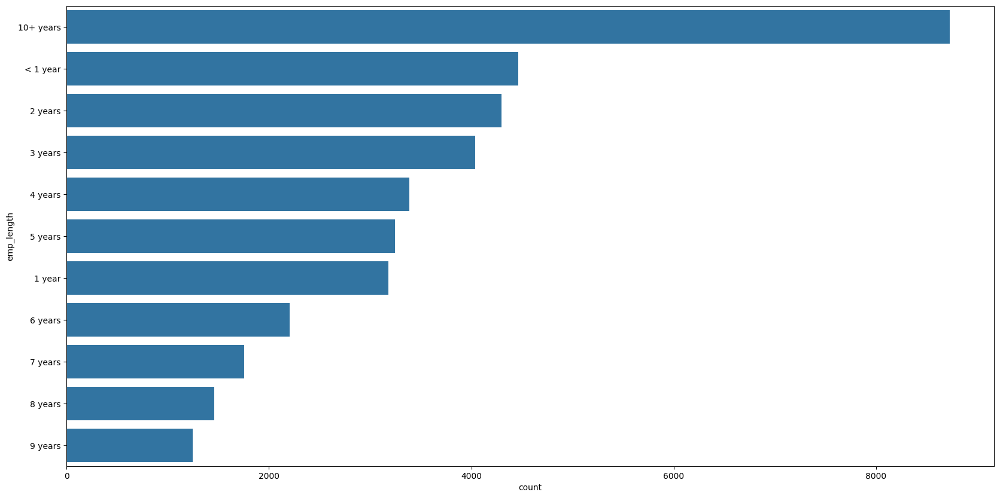

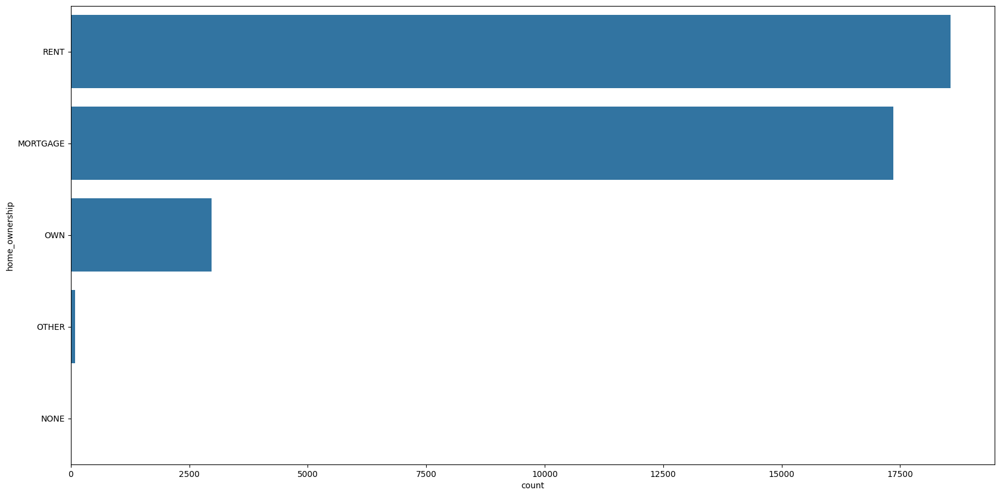

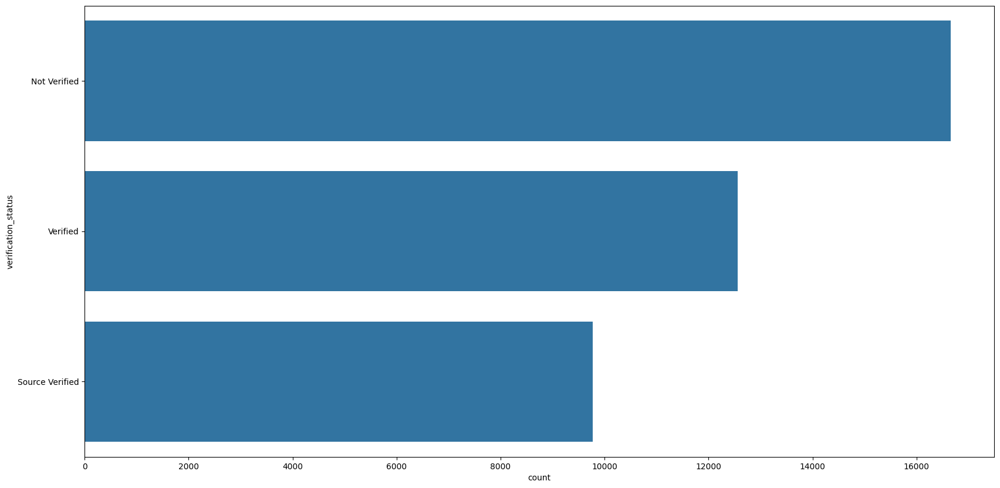

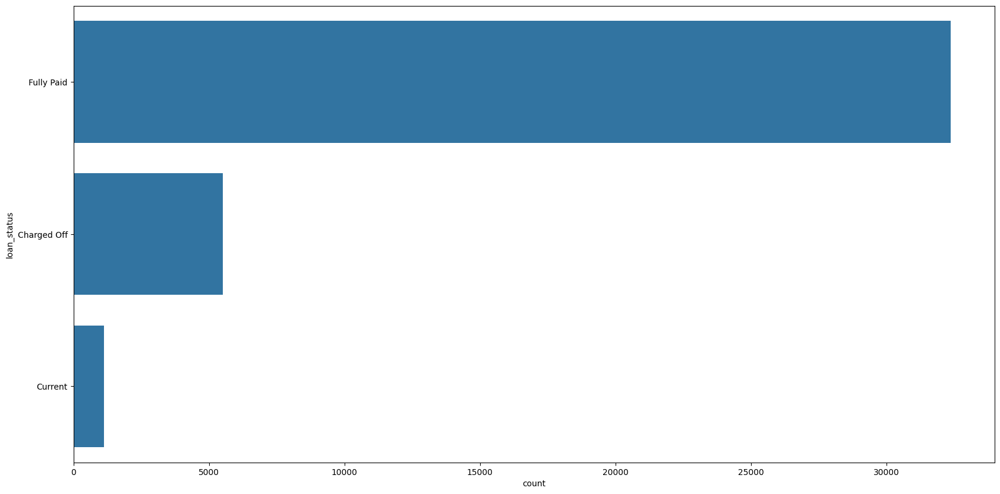

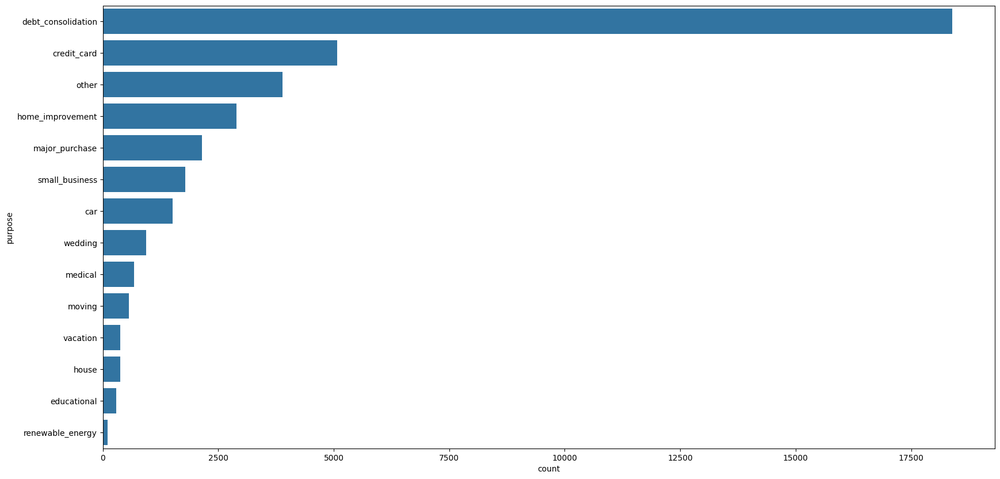

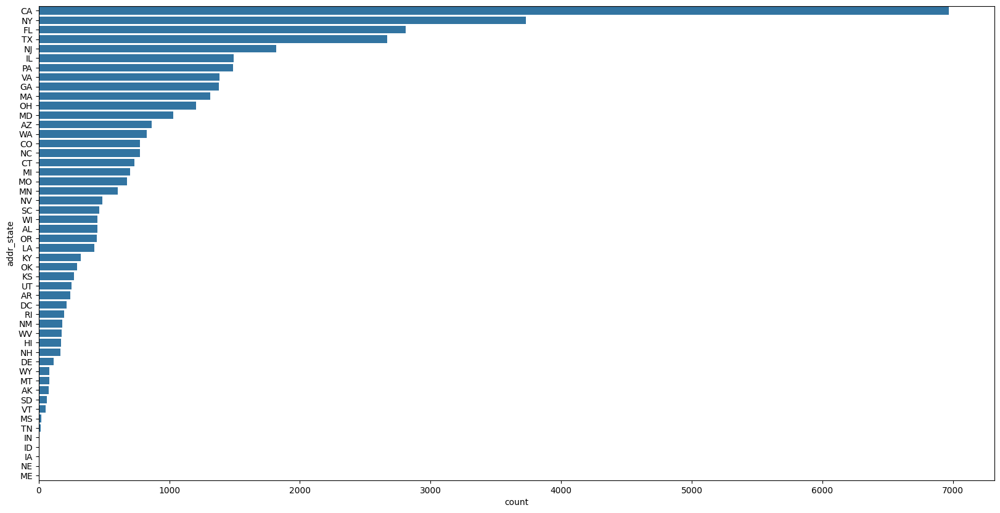

In [46]:
for col in category:
    plt.figure(figsize = (20, 10))
    sns.countplot(data=loan[col],order=loan[col].value_counts().index)
    plt.show()

In [47]:
# drop OTHER and NONE from home_ownership
loan = loan[~loan['home_ownership'].isin(['OTHER','NONE'])]

# drop other from purpose
loan = loan[~loan['purpose'].isin(['other'])]

# combine verified and source verified
loan['verification_status'] = loan['verification_status'].apply(lambda x: 'Verified' if 'Source Verified' in x else x)


Distribution of numerical variables with respect to Loanstatus

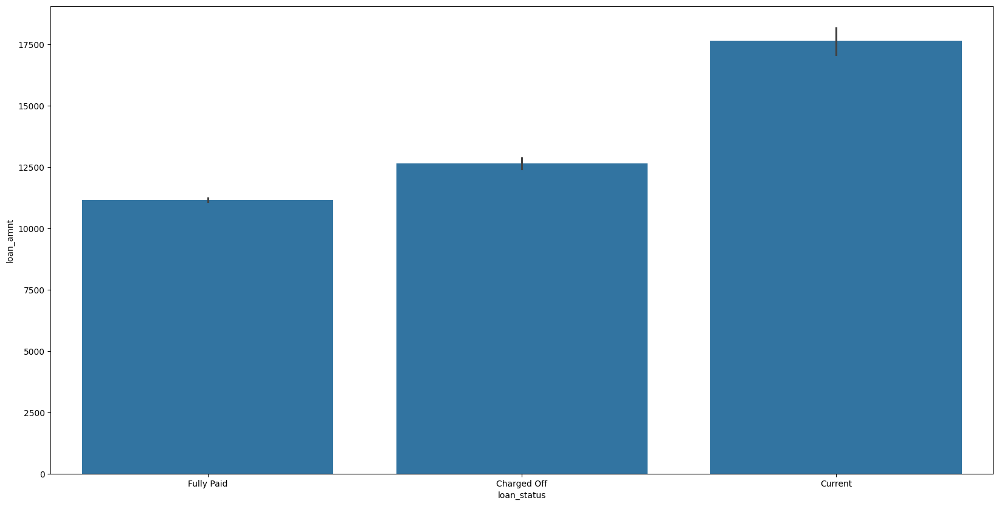

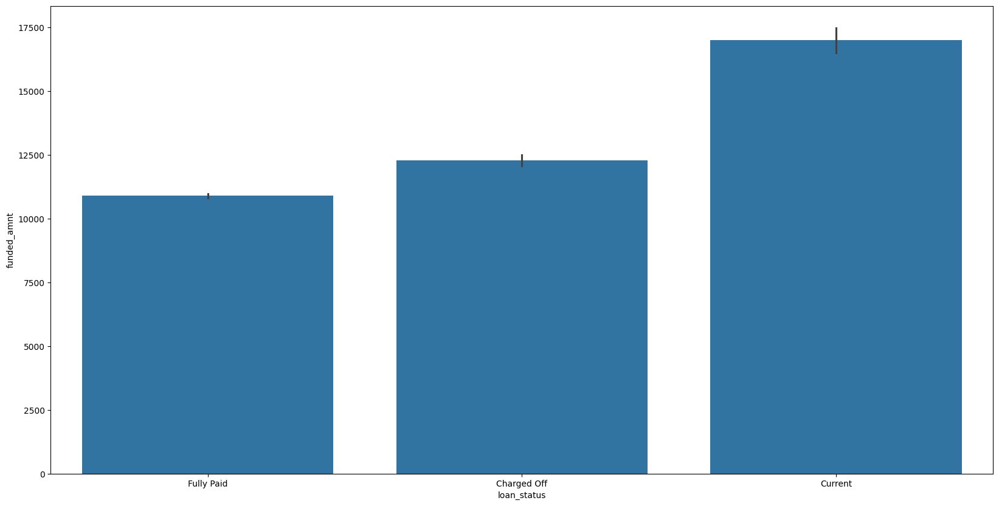

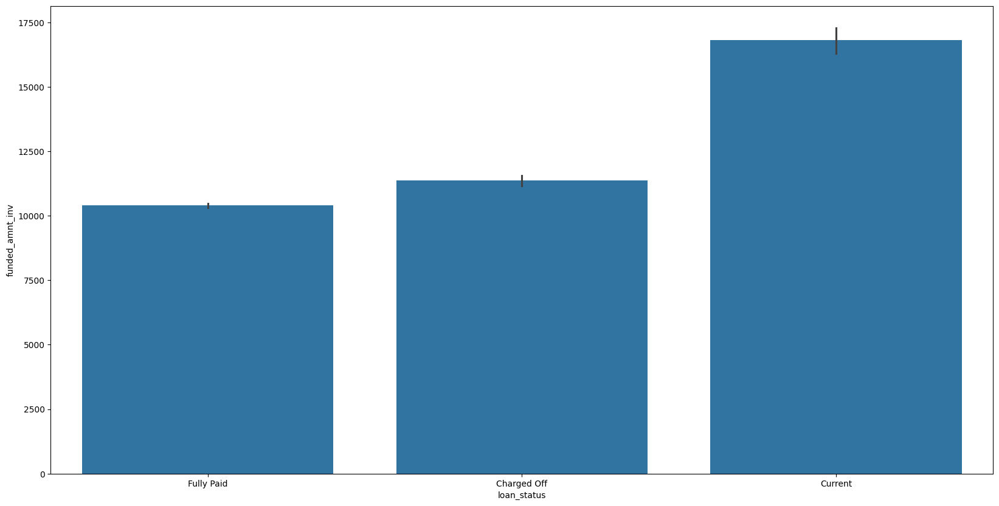

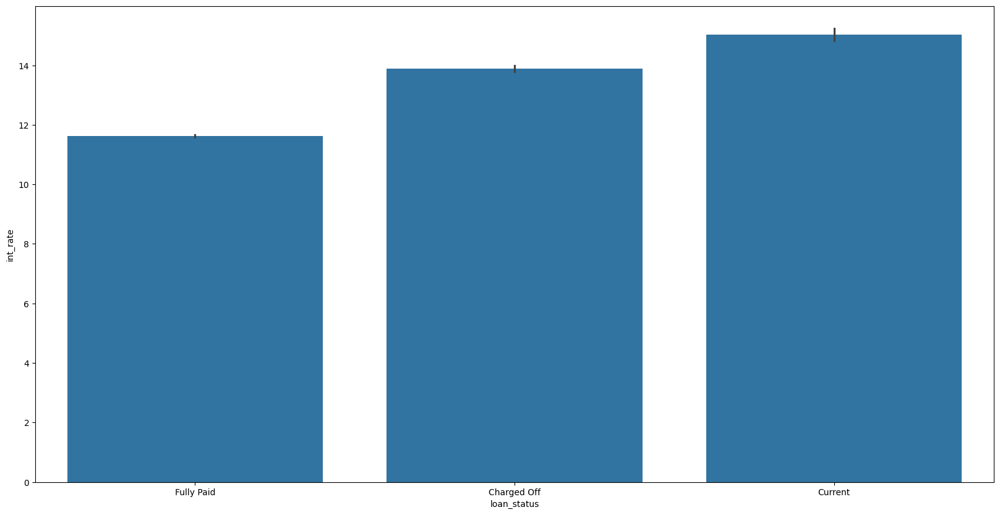

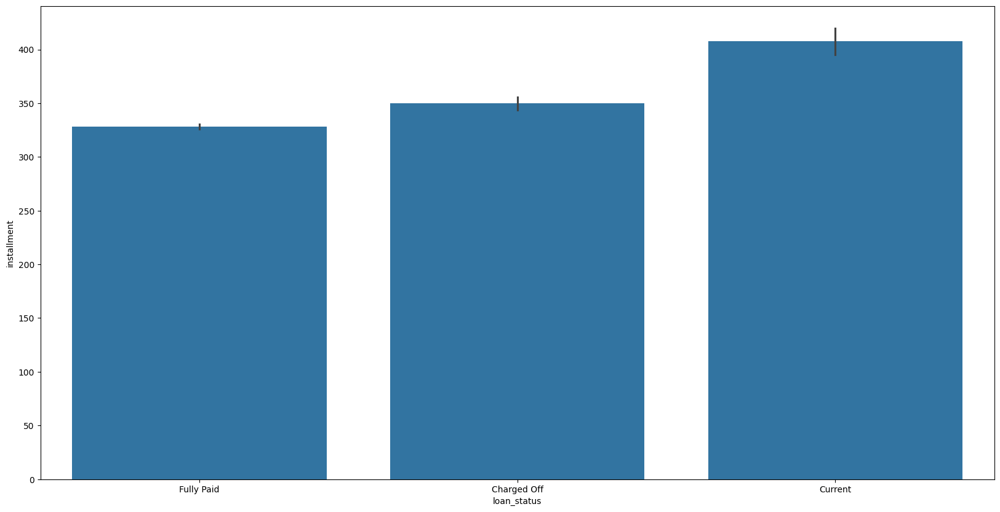

...

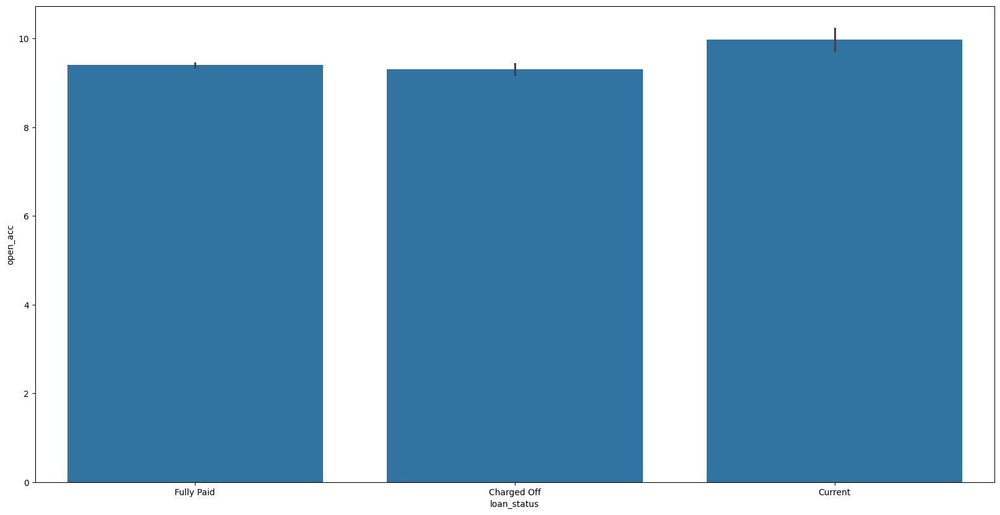

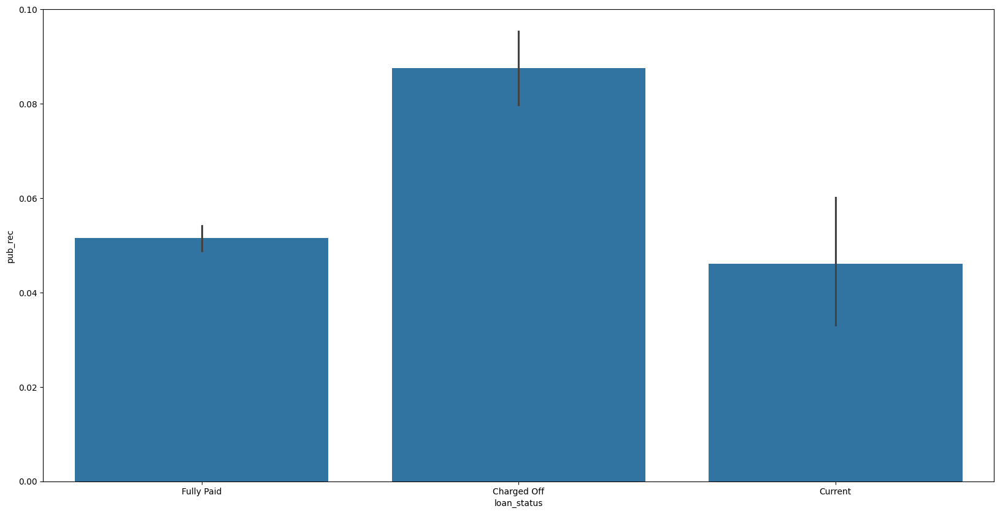

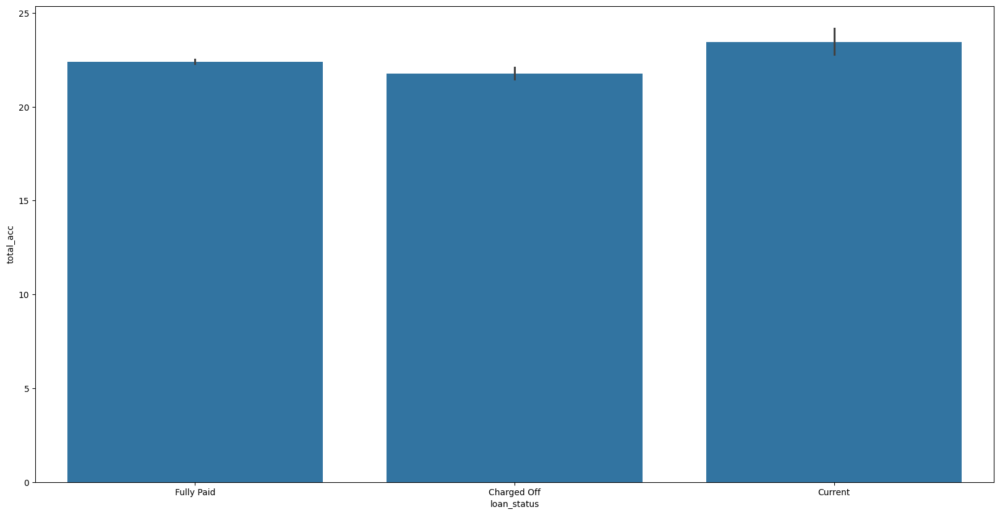

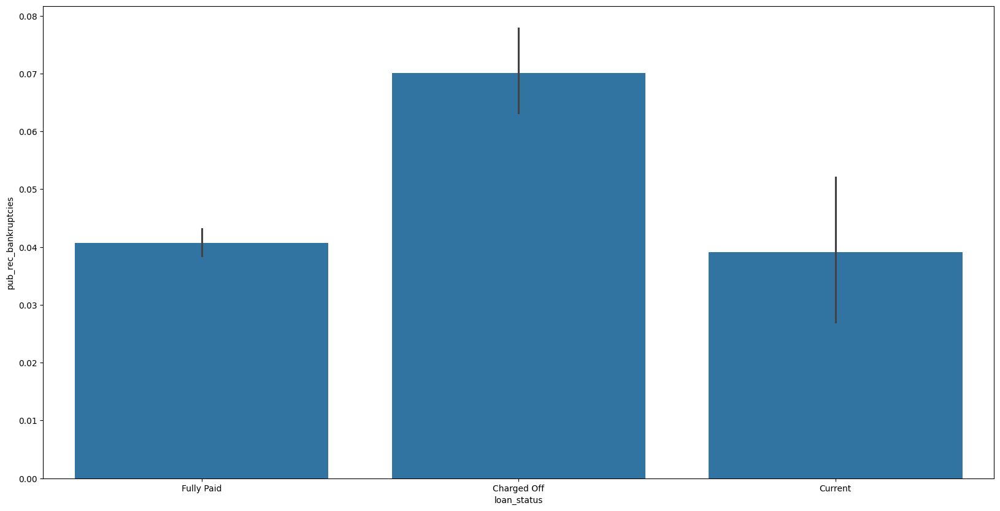

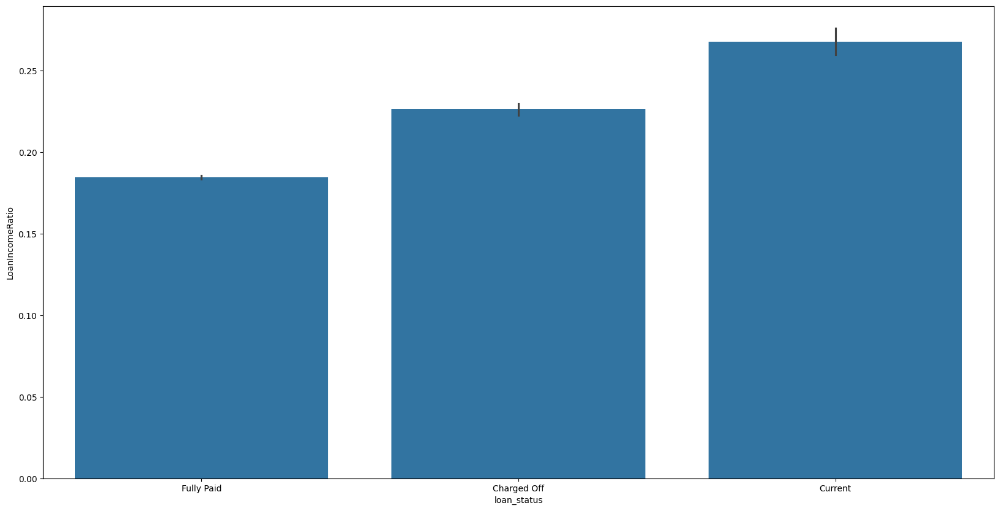

In [48]:
for col in numerical:
    plt.figure(figsize = (20, 10))
    sns.barplot(x=loan['loan_status'],y=loan[col])
    plt.show()

Obervations : Those who have public record / public record banckrupties are likely to charged off

Categoirical variables with % of charged off

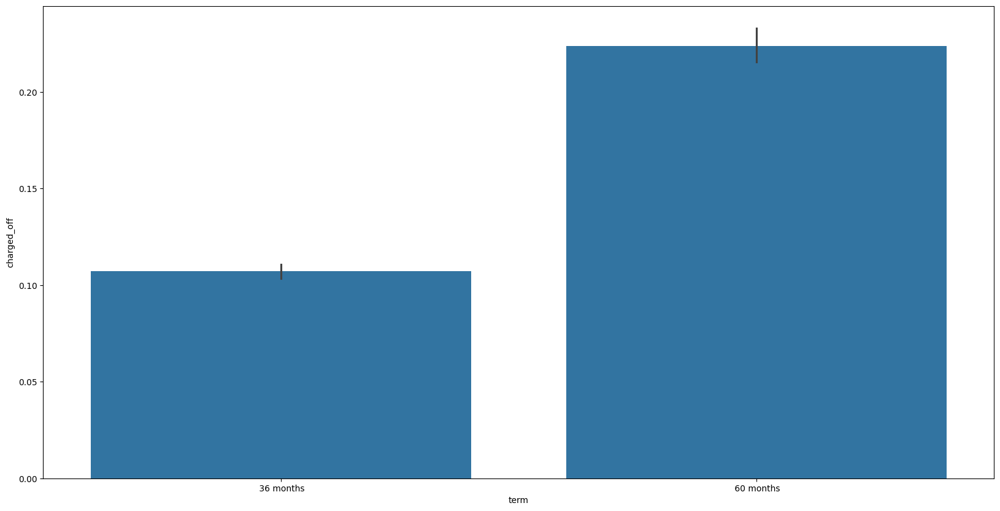

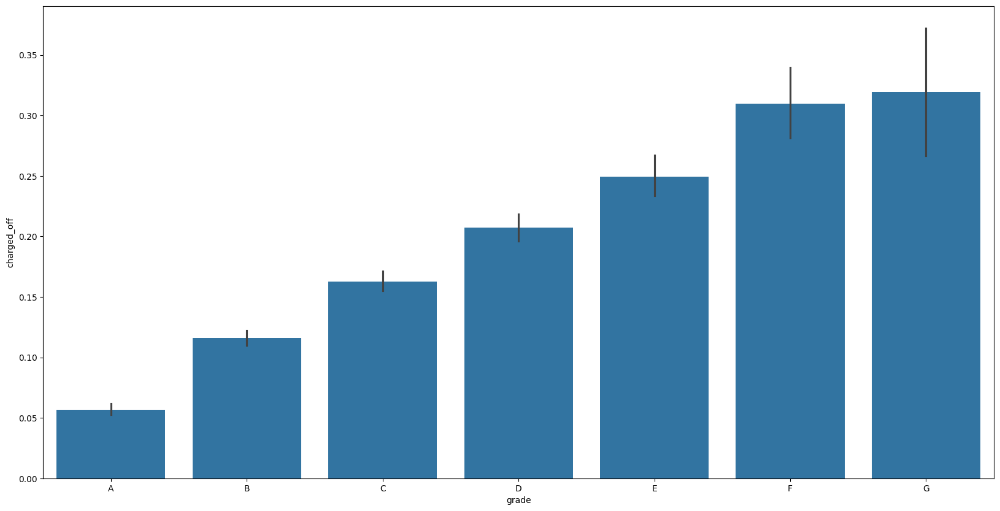

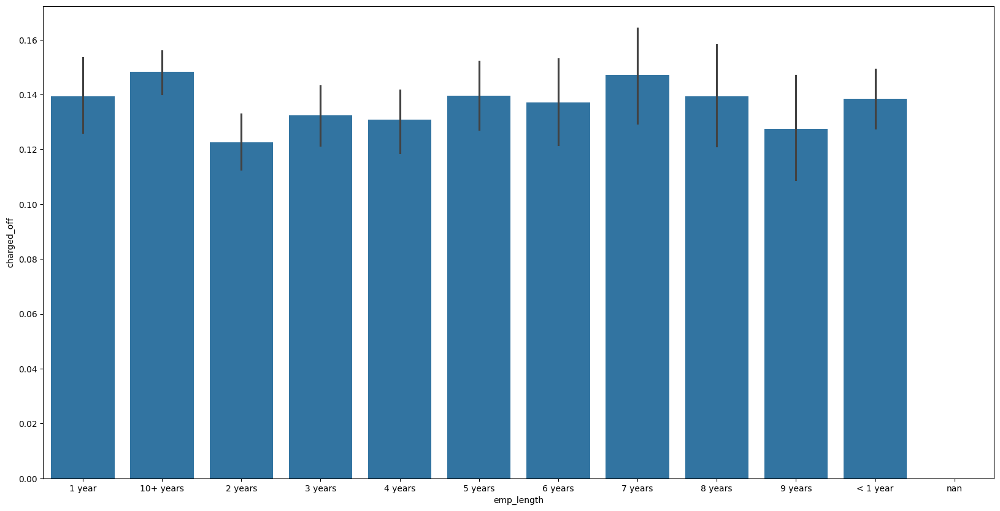

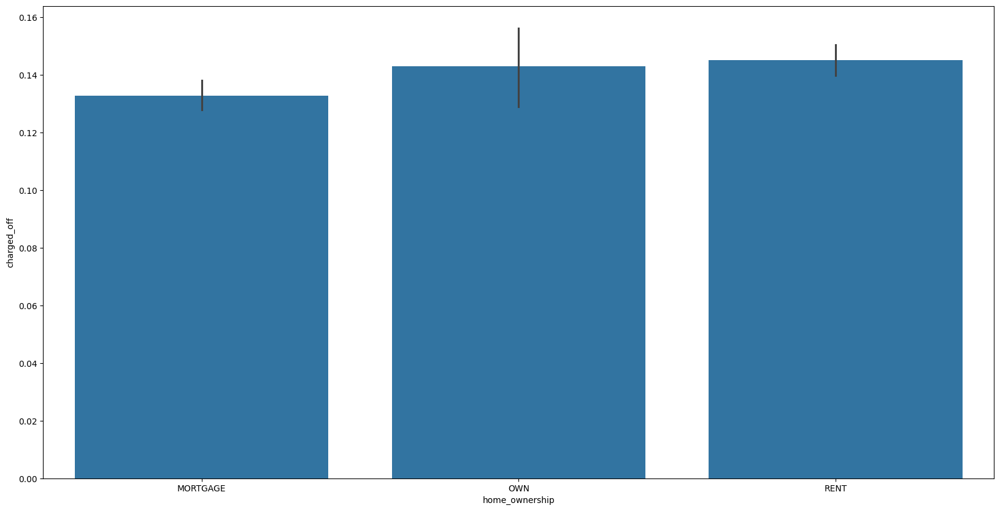

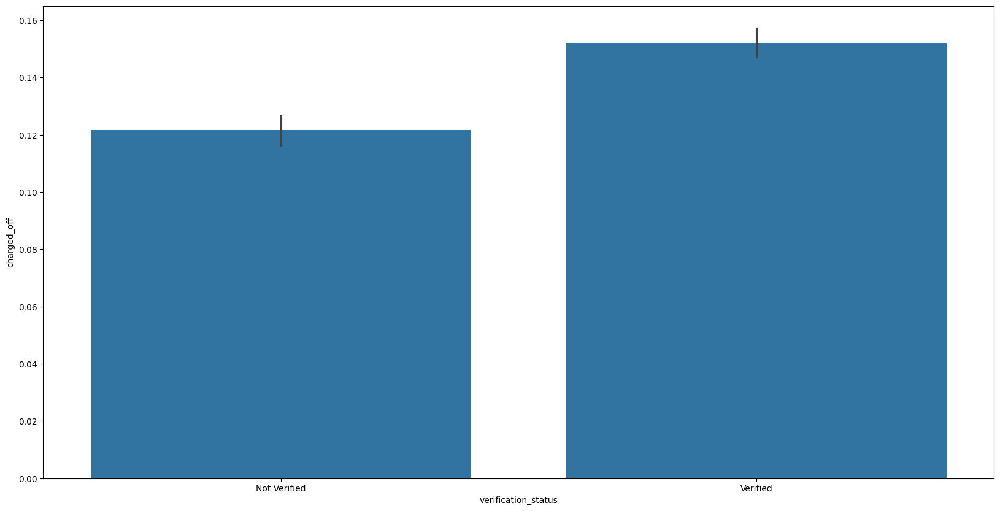

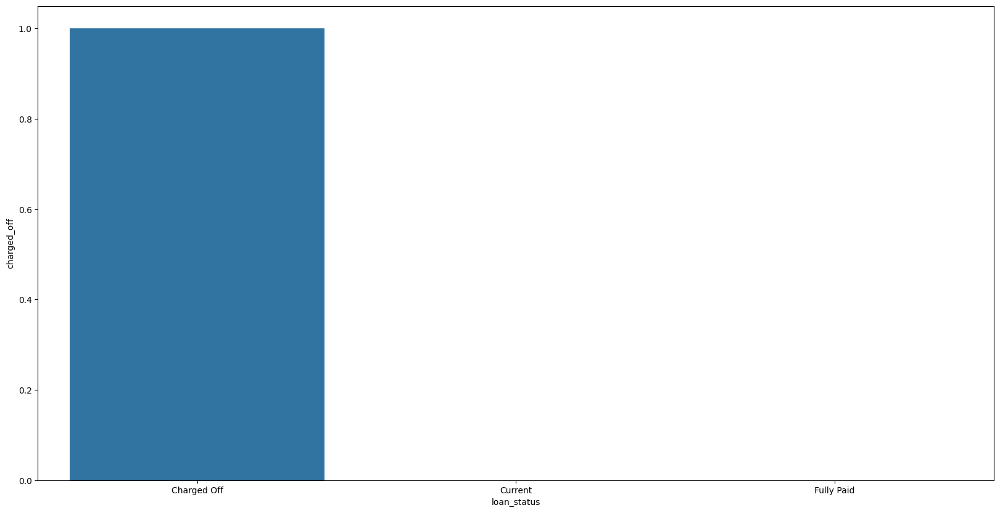

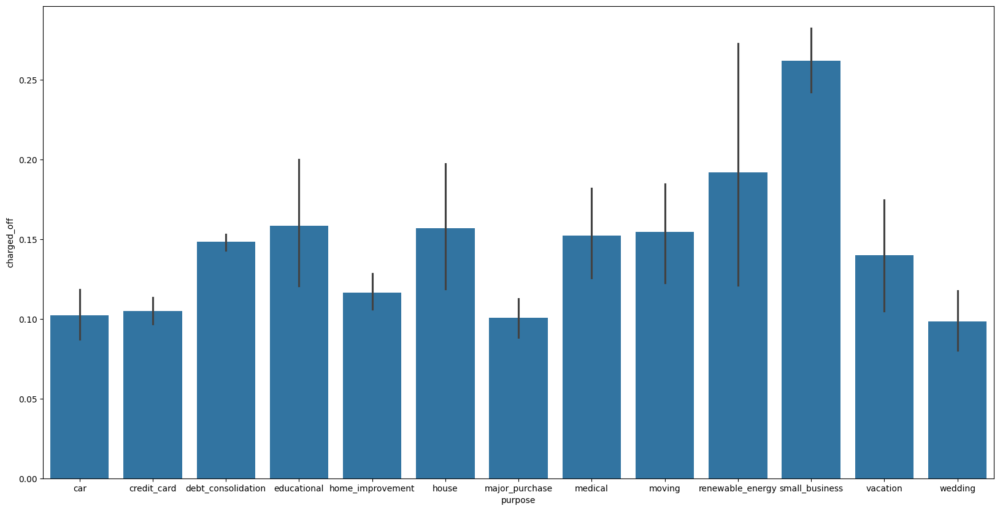

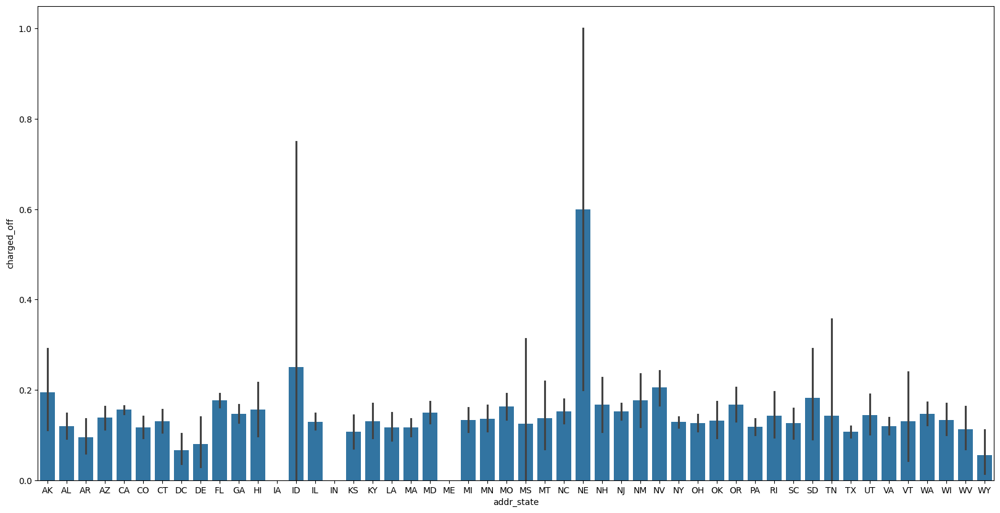

In [49]:
# sort by charged_off
for col in category:
    plt.figure(figsize = (20, 10))
    sns.barplot(x=loan[col],y=loan['charged_off'],order=loan.sort_values(by=col,ascending=True)[col].unique())
    plt.show()
    



Observation: Small Business purpose and High loan term contributing to more Charged off loans

More defaulter in state NE

As grade increases number of defaulters also increasing

plot to depict funded amount distribution with numerical variables

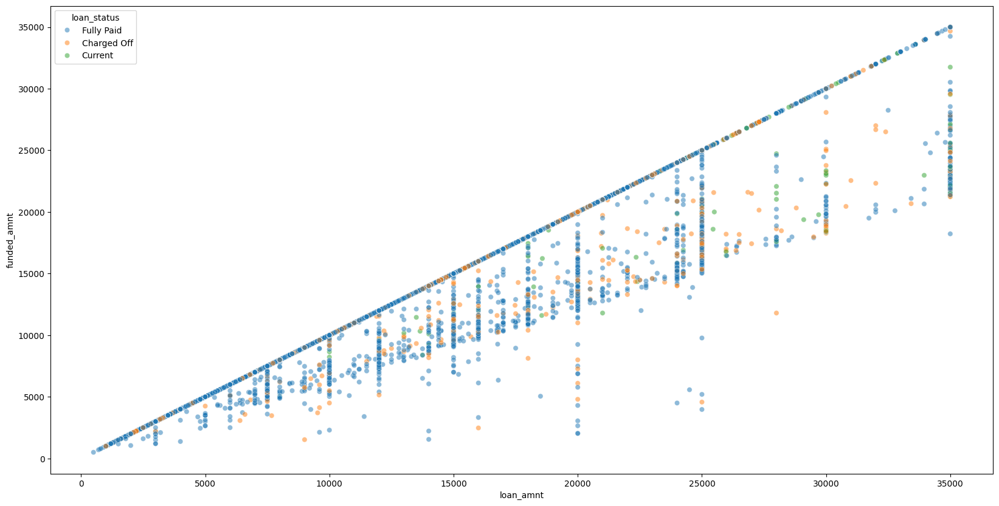

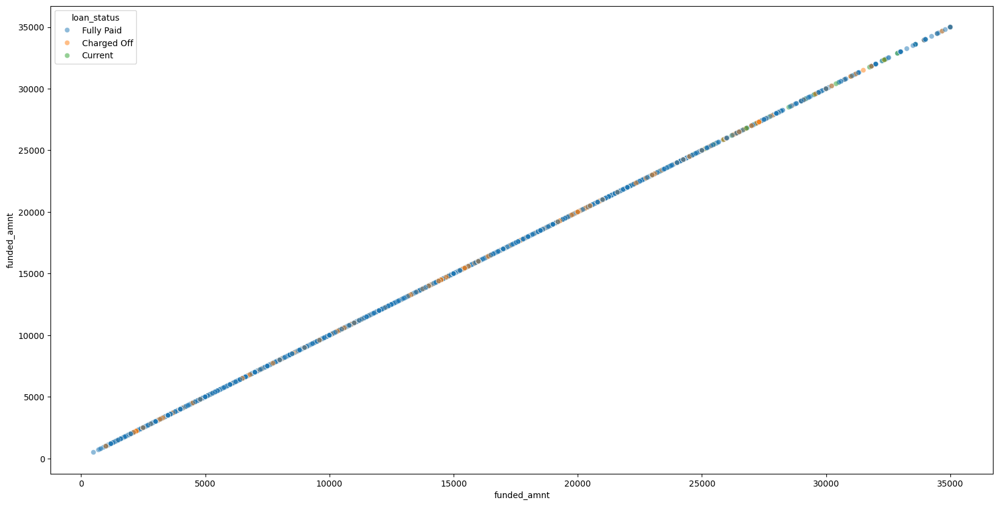

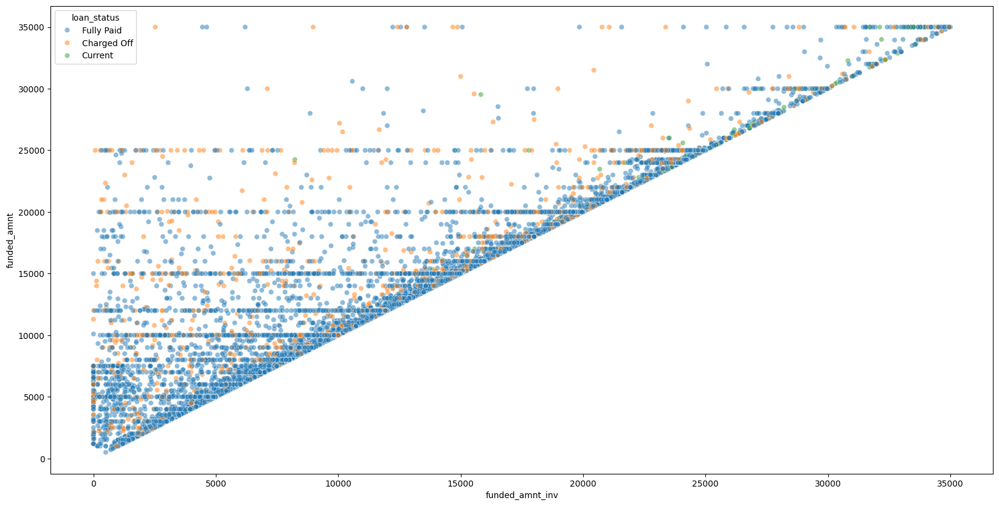

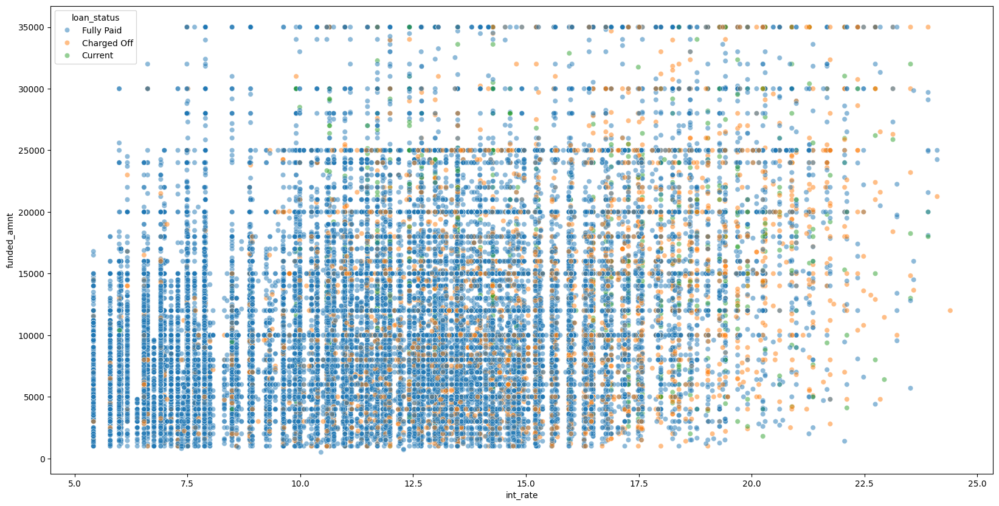

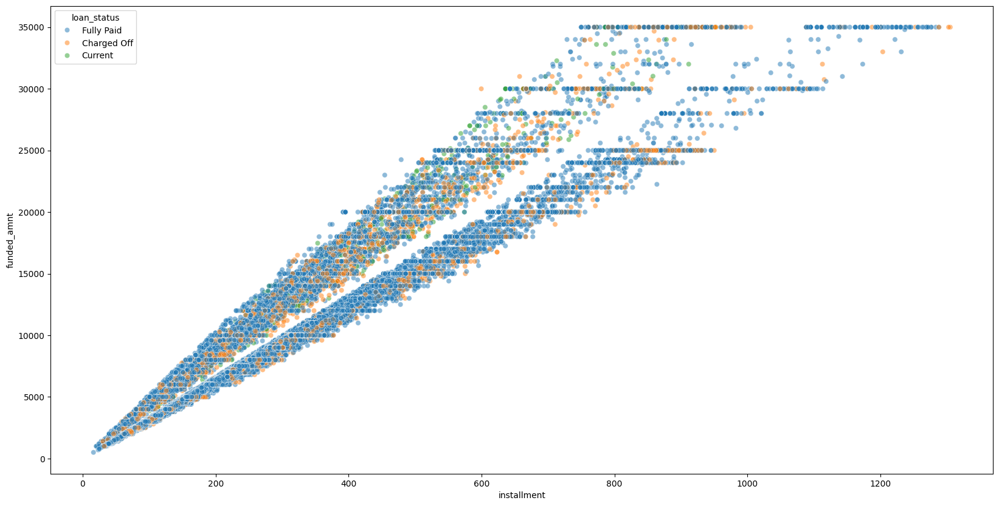

...

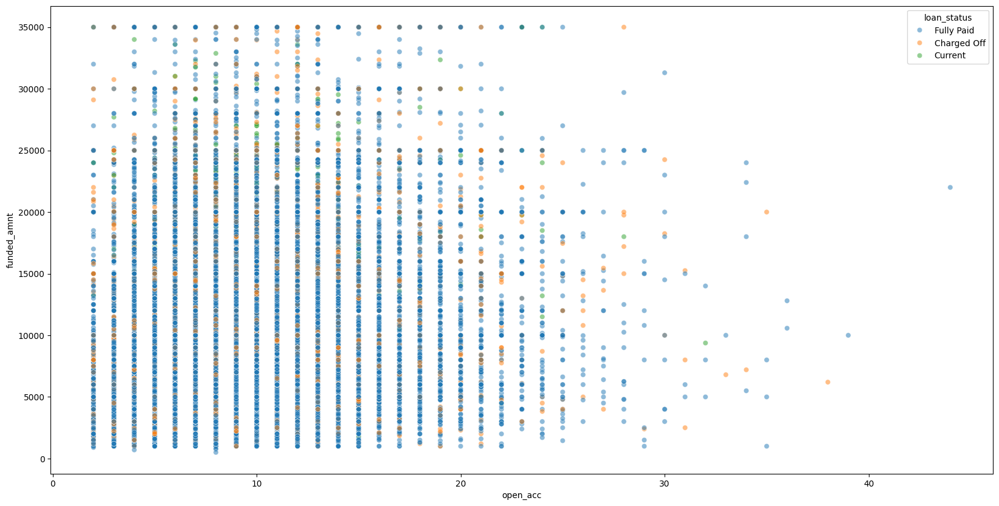

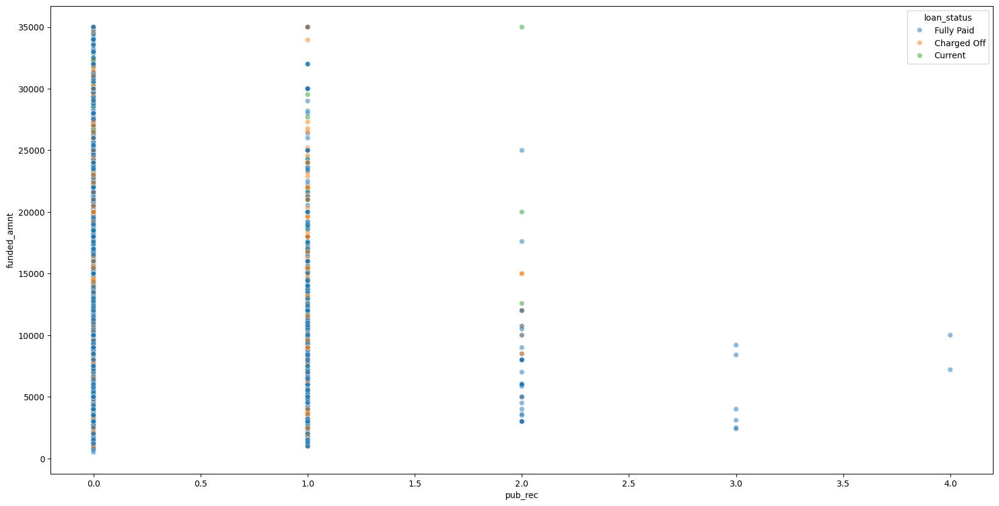

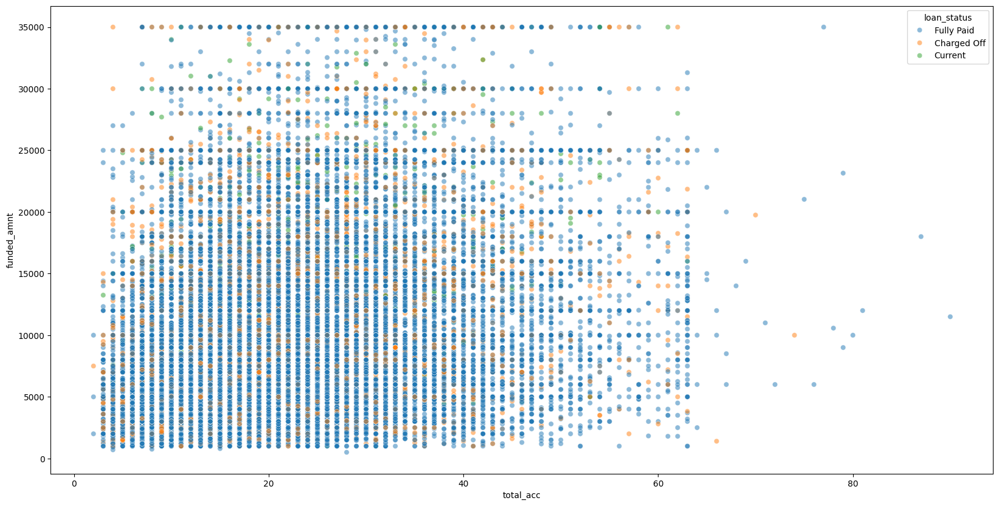

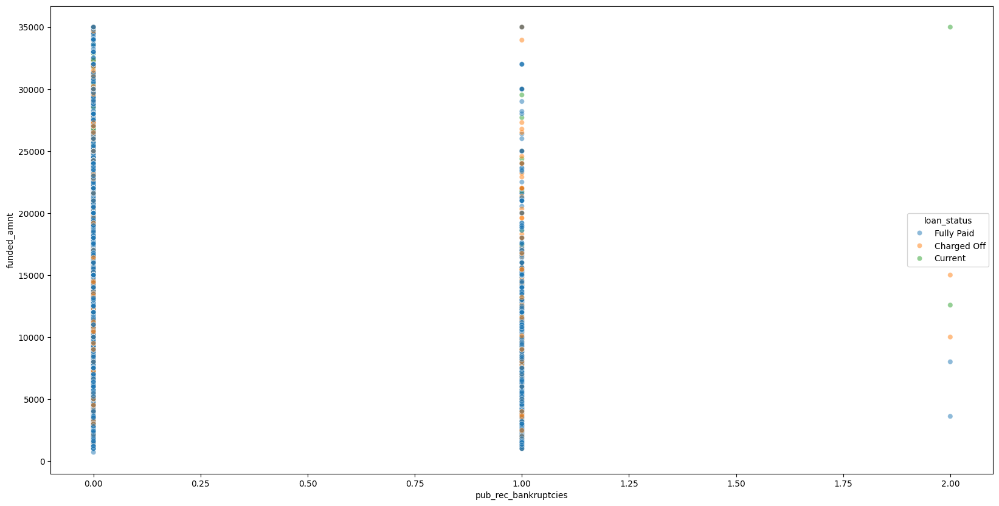

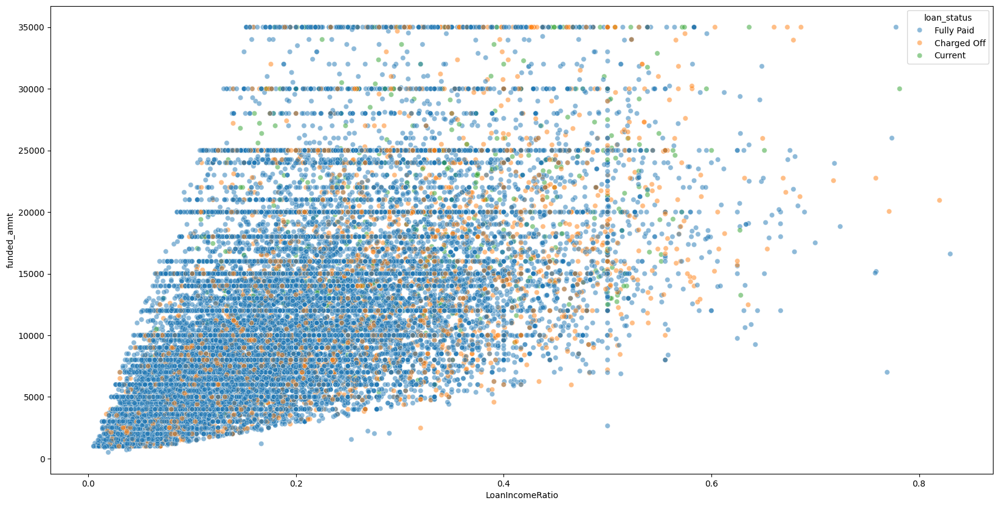

In [50]:
for col in numerical:
    plt.figure(figsize = (20, 10))
    sns.scatterplot(x=loan[col],y=loan['funded_amnt'],hue=loan['loan_status'],alpha=0.5)
    plt.show()




Observation : Too crowded at lesser values need to create bins for annual income

In [51]:
# Create bins for annual income 
loan['annual_inc_bin'] = pd.cut(loan['annual_inc'],bins=np.arange(14000,250000,10000))


# Create bins for interest rate
loan['int_rate_bin'] = pd.cut(loan['int_rate'],bins=[5,10,15,20,25,30],labels=['0-10','10-15','15-20','20-25','25-30'])



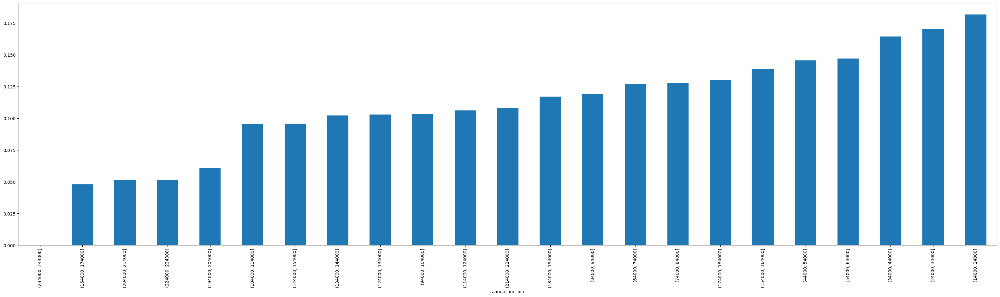

In [52]:
# % of charged off loans in each bin
(loan[loan['loan_status']=='Charged Off']['annual_inc_bin'].value_counts()/loan['annual_inc_bin'].value_counts()).sort_values().plot(kind='bar', figsize=(40, 10))
plt.show()


Observation : Charge off % decreases as annual income increases

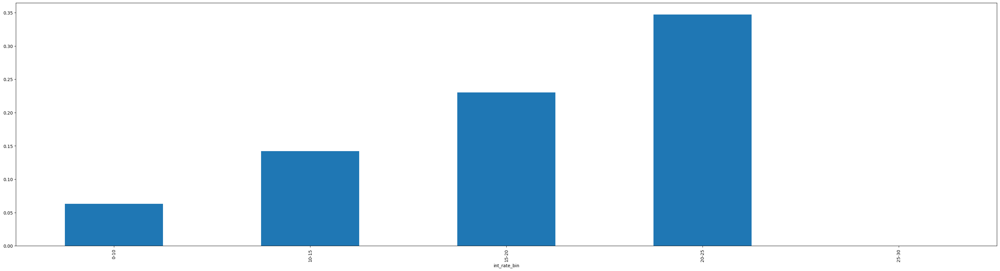

In [53]:
(loan[loan['loan_status']=='Charged Off']['int_rate_bin'].value_counts()/loan['int_rate_bin'].value_counts()).sort_values().plot(kind='bar', figsize=(40, 10))
plt.show()

Observation : Charge off % increases as interest rate increases

In [54]:
# bin for loan income ratio
loan['LoanIncomeRatio_bin'] = pd.cut(loan['LoanIncomeRatio'],bins=[0,0.2,0.4,0.6,0.8,1],labels=['0-0.2','0.2-0.4','0.4-0.6','0.6-0.8','0.8-1'])


                                                                   
                                    

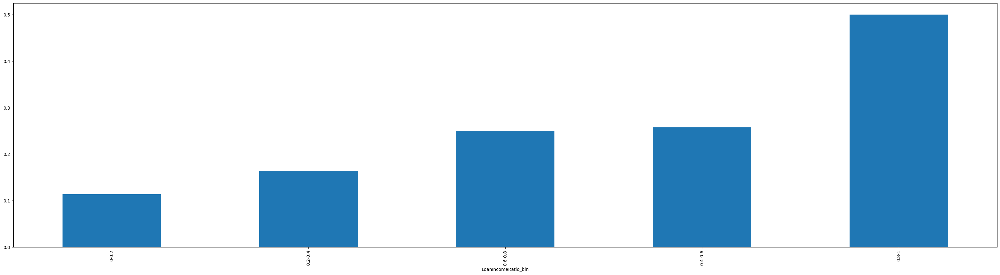

In [55]:
(loan[loan['loan_status']=='Charged Off']['LoanIncomeRatio_bin'].value_counts()/loan['LoanIncomeRatio_bin'].value_counts()).sort_values().plot(kind='bar', figsize=(40, 10))
plt.show()

Observation : if high loan given to less income person , person likely to default

In [56]:
#  bins for dti
loan['dti_bin'] = pd.cut(loan['dti'], bins=[0, 2, 4, 6, 8, 10, 12, 14, 16, 18, 20])

                            
                            



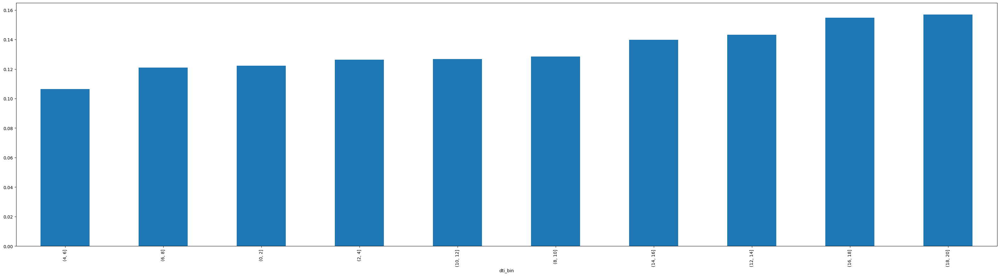

In [57]:
(loan[loan['loan_status']=='Charged Off']['dti_bin'].value_counts()/loan['dti_bin'].value_counts()).sort_values().plot(kind='bar', figsize=(40, 10))
plt.show()

Observation as DTI increases default percentage also increasing